In [7]:
# data pre-processing
import numpy as np
import pandas as pd

from sklearn.preprocessing import StandardScaler

# data mining
from sklearn.decomposition import PCA

# visualization
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

import warnings
warnings.filterwarnings(action = 'ignore')

In [8]:

from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer


In [9]:
# Read file
station = pd.read_csv("station_ecology_master.csv")

station.head()

,station_id,station_name,district,address,latitude,longitude,installation_date,lcd_rack_count,qr_rack_count,operation_type,...,middle_age_ratio,age_entropy,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean
0,301,경복궁역 7번출구 앞,종로구,서울특별시 종로구 사직로 지하130 경복궁역 7번출구 앞,37.575794,126.971451,2015-10-07 12:03:46.000,0.0,20.0,QR,...,0.622050,1.571667,0.000000,0.000000,0.000000,0.000000,61.0,0.196078,0.420806,1.967742
1,302,경복궁역 4번출구 뒤,종로구,서울특별시 종로구 사직로 지하130 경복궁역 4번출구 뒤,37.575947,126.974060,2015-10-07 12:04:22.000,0.0,12.0,QR,...,0.573147,1.549042,4.140862,1.053792,0.099198,0.404017,377.0,0.984211,0.182805,4.010638
2,303,광화문역 1번출구 앞,종로구,서울특별시 종로구 세종대로 지하189 세종로공원,37.571770,126.974663,2015-10-07 00:00:00.000,0.0,8.0,QR,...,0.663649,1.574669,3.877326,0.992530,0.081692,0.380265,59.0,0.552632,0.358085,2.565217
3,305,종로구청 옆,종로구,서울특별시 종로구 세종로 84-1,37.572559,126.978333,2015-01-07 00:00:00.000,0.0,16.0,QR,...,0.693084,1.565585,0.000000,0.000000,0.000000,0.000000,66.0,1.062500,0.408887,1.650000
4,307,서울역사박물관 앞,종로구,서울특별시 종로구 새문안로 55 서울역사박물관 앞,37.570000,126.971100,2015-10-07 12:09:09.000,0.0,11.0,QR,...,0.646261,1.551401,3.634888,1.029791,0.113786,0.455242,38.0,1.235294,0.457997,1.809524


In [10]:

# Delete categorical column
station = station.drop(columns=[
    "latitude",
    "longitude",
    "district",
    "address",
    "operation_type",
    "station_type" ,
    "station_name",
    "station_id",
    "round_trip_ratio"

])



In [11]:
station.head()

,installation_date,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,...,middle_age_ratio,age_entropy,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean
0,2015-10-07 12:03:46.000,0.0,20.0,20.0,1.0,3883,15.625478,1.487048,0.091720,0.002548,...,0.622050,1.571667,0.000000,0.000000,0.000000,0.000000,61.0,0.196078,0.420806,1.967742
1,2015-10-07 12:04:22.000,0.0,12.0,12.0,1.0,3883,16.966642,1.635869,0.058738,0.001450,...,0.573147,1.549042,4.140862,1.053792,0.099198,0.404017,377.0,0.984211,0.182805,4.010638
2,2015-10-07 00:00:00.000,0.0,8.0,8.0,1.0,3884,15.733066,1.441492,0.042649,0.000000,...,0.663649,1.574669,3.877326,0.992530,0.081692,0.380265,59.0,0.552632,0.358085,2.565217
3,2015-01-07 00:00:00.000,0.0,16.0,16.0,1.0,4157,21.576068,2.109980,0.034188,0.000855,...,0.693084,1.565585,0.000000,0.000000,0.000000,0.000000,66.0,1.062500,0.408887,1.650000
4,2015-10-07 12:09:09.000,0.0,11.0,11.0,1.0,3883,20.488591,1.989540,0.064430,0.004027,...,0.646261,1.551401,3.634888,1.029791,0.113786,0.455242,38.0,1.235294,0.457997,1.809524


In [12]:
print(station.dtypes)

installation_date        object
lcd_rack_count          float64
qr_rack_count           float64
total_rack_count        float64
qr_ratio                float64
station_age_days          int64
avg_trip_duration       float64
avg_distance            float64
sprout_bike_ratio       float64
foreigner_ratio         float64
nonmember_ratio         float64
rush_hour_ratio         float64
late_night_ratio        float64
hourly_entropy          float64
peak_concentration      float64
temporal_stability      float64
weekend_ratio           float64
male_ratio              float64
other_age_ratio         float64
youth_ratio             float64
senior_ratio            float64
middle_age_ratio        float64
age_entropy             float64
destination_entropy     float64
inflow_outflow_ratio    float64
degree_centrality       float64
closeness_centrality    float64
foreigner_activity      float64
foreigner_balance       float64
foreigner_stability     float64
foreigner_daily_mean    float64
dtype: o

In [13]:
# installation_date manipulation

station["installation_date"] = pd.to_datetime(
    station["installation_date"],
    format="mixed",
    errors="coerce"
)

today = pd.Timestamp.today()

station["days_since_installation"] = (
    today - station["installation_date"]
).dt.days

station = station.drop(columns=["installation_date"])



station_st = StandardScaler().fit_transform(station)
station_st = pd.DataFrame(station_st, columns = station.columns)

station_st.head(10)

,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,nonmember_ratio,...,age_entropy,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean,days_since_installation
0,-0.725532,1.710330,1.431339,0.802099,1.628125,-0.636463,-0.823703,3.644069,0.598253,-0.448559,...,-0.034152,-1.037079,-1.007519,-0.858814,-1.049441,0.585982,-0.554504,0.340592,0.748165,1.628058
1,-0.725532,0.636801,-0.016091,0.802099,1.628125,-0.372703,-0.601586,2.050881,0.227837,0.197617,...,-0.208180,1.193880,1.122737,1.375022,1.060438,5.414327,0.363761,-0.392630,2.895306,1.628058
2,-0.725532,0.100037,-0.739806,0.802099,1.629365,-0.615305,-0.891697,1.273697,-0.261686,0.335789,...,-0.011062,1.051896,0.998896,0.980815,0.936396,0.555423,-0.139078,0.147363,1.376128,1.628058
3,-0.725532,1.173566,0.707624,0.802099,1.967785,0.533813,0.106032,0.864972,0.026798,-0.401481,...,-0.080934,-1.037079,-1.007519,-0.858814,-1.049441,0.662380,0.454977,0.303871,0.414209,1.966310
4,-0.725532,0.502610,-0.197020,0.802099,1.628125,0.319943,-0.073726,2.325802,1.097479,-0.150972,...,-0.190034,0.921278,1.074219,1.703527,1.327946,0.234552,0.656302,0.455167,0.581873,1.628058
5,-0.725532,3.186432,3.421556,0.802099,1.628125,-0.876249,-1.003341,1.038377,-0.261686,-0.298003,...,-0.962616,1.342322,0.831518,1.555699,1.017404,0.051197,-0.166132,1.009203,0.118262,1.628058
6,-0.725532,0.770992,0.164838,0.802099,1.629365,-0.079559,0.038638,1.221310,-0.261686,-0.321966,...,0.198360,1.063032,1.025472,1.506424,1.072344,-0.071040,0.382158,0.855641,0.399877,1.628058
7,-0.725532,0.368419,-0.377949,0.802099,1.628125,1.226418,-0.179161,0.679774,2.015049,1.054333,...,-0.093451,-1.037079,-1.007519,-0.858814,-1.049441,2.006982,0.162842,-0.013668,1.095809,1.628058
8,-0.725532,0.100037,-0.739806,0.802099,1.629365,0.482784,-0.459755,0.571488,-0.035765,0.354341,...,-0.298995,0.884835,1.009572,0.208828,0.716920,0.585982,0.142281,0.152127,0.565681,1.628058
9,-0.725532,1.039374,0.526695,0.802099,1.628125,-0.522356,-0.616307,1.327528,2.692589,-0.231458,...,0.041401,0.877493,1.054062,0.570184,1.034283,2.129219,0.326007,-0.179922,1.340428,1.628058


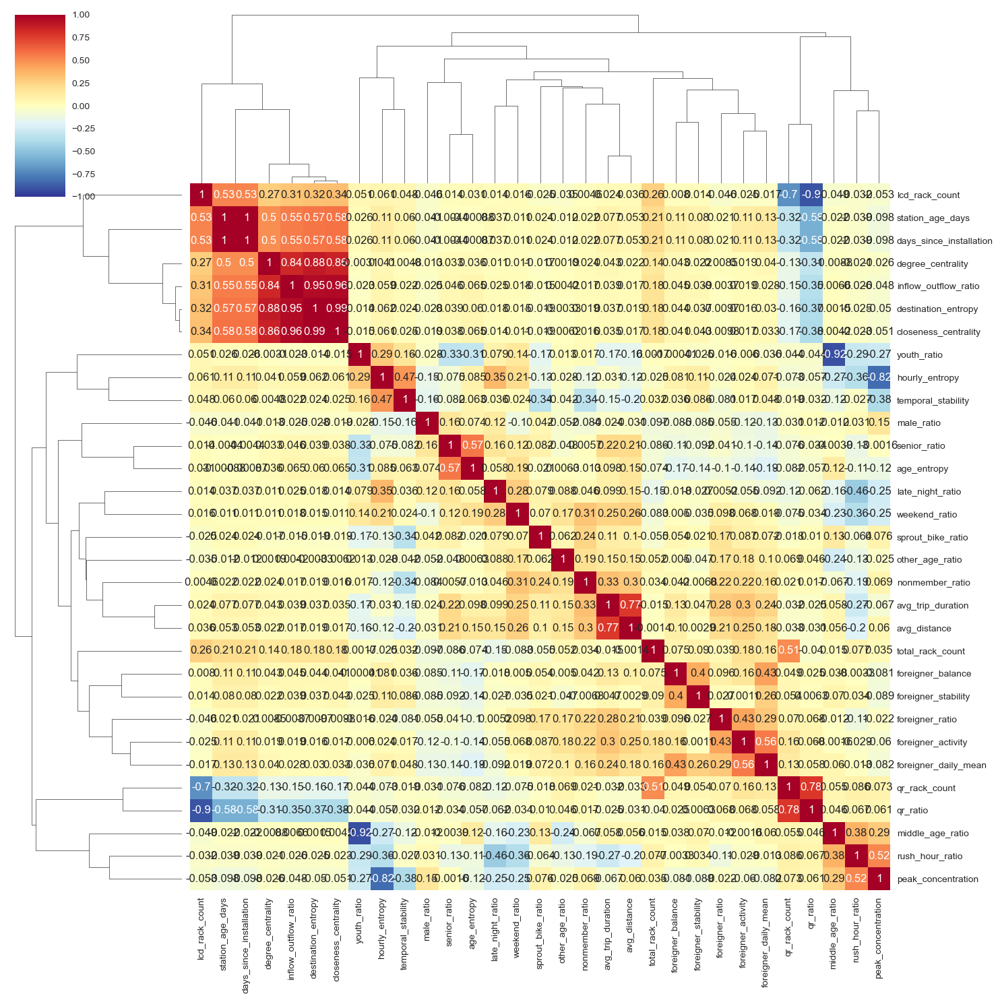

In [14]:
#correlation matrix
cor = station_st.select_dtypes(include='number').corr()

sns.clustermap(
    cor,
    annot=True,
    cmap='RdYlBu_r',
    vmin=-1,
    vmax=1,
    figsize=(15,15)
)

plt.show()

In [ ]:
station_st[
    station_st[
        ['rush_hour_ratio',
         'late_night_ratio',
         'hourly_entropy',
         'peak_concentration',
         'temporal_stability',
         'weekend_ratio']
    ].isnull().all(axis=1)
]
#There is no record that people use this renatl station in novembe 2024. So, The null value came.

In [ ]:
mask = station_st[
    ['rush_hour_ratio',
     'late_night_ratio',
     'hourly_entropy',
     'peak_concentration',
     'temporal_stability',
     'weekend_ratio']
].isnull().all(axis=1)

print(mask.sum())

In [50]:
station_st = station_st.fillna(0)
#I made its value to 0

In [48]:
pca = PCA(random_state = 2000, n_components = None)
pca.fit_transform(station_st)

array([[-1.27880054e+00,  2.17100827e+00,  1.66761744e+00, ...,
         4.99650630e-05,  5.32328918e-14, -3.09420134e-13],
       [ 2.39685287e+00,  4.15663079e-01,  3.37129412e+00, ...,
         1.58052316e-04,  1.75765945e-13, -9.86338190e-13],
       [ 1.84925090e+00,  2.38758314e+00,  1.16758213e+00, ...,
        -7.69254348e-04, -8.44888700e-13,  4.78579956e-12],
       ...,
       [-3.74381793e+00, -3.90267999e-01, -1.13596528e+00, ...,
         4.67901714e-04,  5.17869360e-13, -2.91292978e-12],
       [-4.24121099e+00,  2.47188472e+00, -1.51481015e+00, ...,
         4.22129312e-04,  4.61794304e-13, -2.62863384e-12],
       [-4.07210569e+00,  1.66568957e+00,  4.11408252e-01, ...,
         4.38788279e-04,  4.85231983e-13, -2.73417880e-12]])

In [52]:
station_st.isnull().sum()
#check null value

lcd_rack_count             0
qr_rack_count              0
total_rack_count           0
qr_ratio                   0
station_age_days           0
avg_trip_duration          0
avg_distance               0
sprout_bike_ratio          0
foreigner_ratio            0
nonmember_ratio            0
rush_hour_ratio            0
late_night_ratio           0
hourly_entropy             0
peak_concentration         0
temporal_stability         0
weekend_ratio              0
male_ratio                 0
other_age_ratio            0
youth_ratio                0
senior_ratio               0
middle_age_ratio           0
age_entropy                0
destination_entropy        0
inflow_outflow_ratio       0
degree_centrality          0
closeness_centrality       0
foreigner_activity         0
foreigner_balance          0
foreigner_stability        0
foreigner_daily_mean       0
days_since_installation    0
dtype: int64

In [72]:
#PCA processing
pca = PCA(random_state = 2000, n_components = None)
pca.fit_transform(station_st)

array([[-1.27880054e+00,  2.17100827e+00,  1.66761744e+00, ...,
         4.99650630e-05,  5.32328918e-14, -3.09420134e-13],
       [ 2.39685287e+00,  4.15663079e-01,  3.37129412e+00, ...,
         1.58052316e-04,  1.75765945e-13, -9.86338190e-13],
       [ 1.84925090e+00,  2.38758314e+00,  1.16758213e+00, ...,
        -7.69254348e-04, -8.44888700e-13,  4.78579956e-12],
       ...,
       [-3.74381793e+00, -3.90267999e-01, -1.13596528e+00, ...,
         4.67901714e-04,  5.17869360e-13, -2.91292978e-12],
       [-4.24121099e+00,  2.47188472e+00, -1.51481015e+00, ...,
         4.22129312e-04,  4.61794304e-13, -2.62863384e-12],
       [-4.07210569e+00,  1.66568957e+00,  4.11408252e-01, ...,
         4.38788279e-04,  4.85231983e-13, -2.73417880e-12]])

In [74]:
# variance or eigenvalues
pca.explained_variance_

array([5.51808937e+00, 3.25094911e+00, 3.10379311e+00, 2.63144893e+00,
       2.04492853e+00, 1.83313835e+00, 1.33020430e+00, 1.12126899e+00,
       1.08419332e+00, 1.05604698e+00, 9.07618658e-01, 8.58748503e-01,
       7.39831160e-01, 6.99494640e-01, 6.55277369e-01, 6.32935067e-01,
       5.75498791e-01, 5.41218625e-01, 4.61903721e-01, 4.16657180e-01,
       3.63717122e-01, 3.40611972e-01, 1.88405093e-01, 1.84711218e-01,
       1.19926635e-01, 8.03273003e-02, 5.46929664e-02, 1.23195246e-02,
       5.70549721e-08, 0.00000000e+00, 0.00000000e+00])

In [76]:
pca.explained_variance_ratio_

array([1.79112475e-01, 1.05523036e-01, 1.00746478e-01, 8.54145884e-02,
       6.63766364e-02, 5.95021078e-02, 4.31772974e-02, 3.63954352e-02,
       3.51919907e-02, 3.42783843e-02, 2.94605277e-02, 2.78742441e-02,
       2.40142886e-02, 2.27049995e-02, 2.12697446e-02, 2.05445325e-02,
       1.86802000e-02, 1.75674950e-02, 1.49930009e-02, 1.35243368e-02,
       1.18059476e-02, 1.10559741e-02, 6.11546865e-03, 5.99556861e-03,
       3.89271631e-03, 2.60735567e-03, 1.77528705e-03, 3.99881264e-04,
       1.85195574e-09, 0.00000000e+00, 0.00000000e+00])

In [78]:
exp_variance_ratio = pca.explained_variance_ratio_

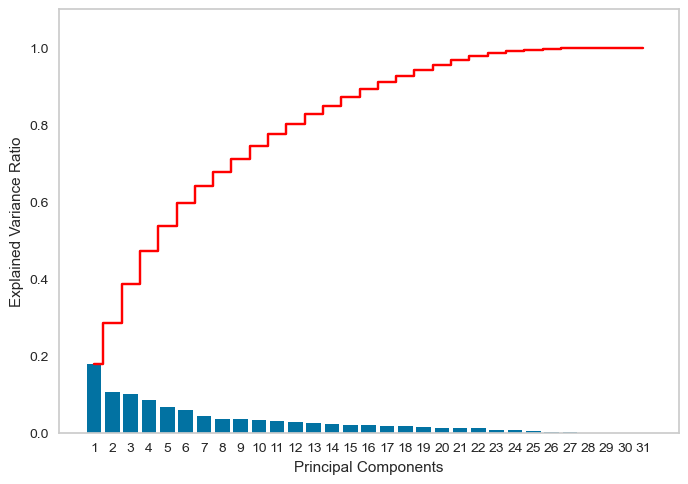

In [80]:
def explained_variance_ratio_plot(exp_variance_ratio):
    x_axis = range(1, len(exp_variance_ratio)+1)
    plt.bar(x_axis, exp_variance_ratio,
            align = 'center', label = 'Individual Explained Variance Ratio')
    plt.step(x_axis, np.cumsum(exp_variance_ratio),
             where = 'mid', color='red', label='Cumulative Explained Variance Ratio')
    plt.ylim(0, 1.1)
    plt.xticks(x_axis)
    plt.xlabel('Principal Components')
    plt.ylabel('Explained Variance Ratio')
    plt.grid()
    plt.show()
   
explained_variance_ratio_plot(exp_variance_ratio)
#THere is elbow point
#in 12 pricipal component

In [82]:
loadings = pca.components_

In [84]:
#12 pricciple components

In [86]:
num_pc = pca.components_.shape[1]
pc_list = ["PC"+str(i) for i in list(range(1, num_pc+1))]

loadings_df = pd.DataFrame.from_dict(dict(zip(pc_list, loadings)))
loadings_df['variable'] = station.columns.values
loadings_df = loadings_df.set_index('variable')
loadings_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31
variable,,,,,,,,,,,,,,,,,,,,,
lcd_rack_count,0.278136,0.014759,-0.084322,0.118603,-0.391598,0.044021,0.191704,0.132997,0.052685,-0.077764,...,-0.012640,0.029925,0.003140,0.031102,0.445905,-0.005404,0.001233,-7.325303e-07,-0.000000e+00,5.833305e-01
qr_rack_count,-0.186515,0.028294,0.145055,-0.301311,0.405326,-0.048935,0.145711,0.260822,0.151962,-0.016539,...,-0.018948,-0.011001,0.013733,-0.032654,-0.344000,0.003571,-0.000580,3.965737e-06,4.999810e-15,6.523843e-01
total_rack_count,0.083838,0.055942,0.093919,-0.263270,0.074397,-0.012908,0.427574,0.512002,0.268406,-0.116050,...,-0.040785,0.021244,0.022301,-0.006531,0.073760,-0.001699,0.000704,4.450979e-06,4.115824e-15,-4.838597e-01
qr_ratio,-0.295253,-0.014064,0.105607,-0.176264,0.382580,-0.036212,-0.087085,-0.025145,-0.014539,0.032577,...,-0.012845,0.021696,-0.019532,0.060777,0.812288,-0.018356,0.010544,7.939010e-05,8.725056e-14,-4.980407e-13
station_age_days,0.350663,0.015441,0.019581,-0.041005,-0.137466,0.045694,0.067179,0.121642,0.157747,0.099870,...,-0.008749,0.020554,-0.008765,0.005038,0.051700,0.011226,-0.000719,-7.070974e-01,-7.767336e-10,4.403645e-09
avg_trip_duration,0.045855,-0.160981,0.382526,0.164057,-0.012000,0.084044,0.062901,0.040115,-0.305219,0.063129,...,-0.022135,0.022928,0.679446,-0.044414,0.006430,-0.010796,0.000540,4.456422e-06,4.779401e-15,-2.727957e-14
avg_distance,0.033916,-0.120808,0.371417,0.199999,-0.018659,0.040291,0.090145,0.095969,-0.349269,0.021522,...,-0.095532,-0.036053,-0.631320,0.030754,-0.015722,0.013535,0.000053,-8.203446e-06,-1.005875e-14,5.012698e-14
sprout_bike_ratio,-0.005282,0.018277,0.210949,0.106369,-0.066649,-0.085878,-0.326497,-0.020143,0.551527,-0.094750,...,-0.015658,0.006881,0.010213,-0.000117,-0.001997,-0.001123,0.000353,9.847053e-06,1.140484e-14,-6.101889e-14
foreigner_ratio,0.004384,-0.119956,0.282963,-0.083936,-0.068674,-0.056707,0.055720,-0.304408,0.153421,0.248913,...,-0.159653,-0.018375,-0.027442,-0.008136,-0.012401,-0.004669,-0.001243,4.312776e-06,3.526183e-15,-2.682885e-14


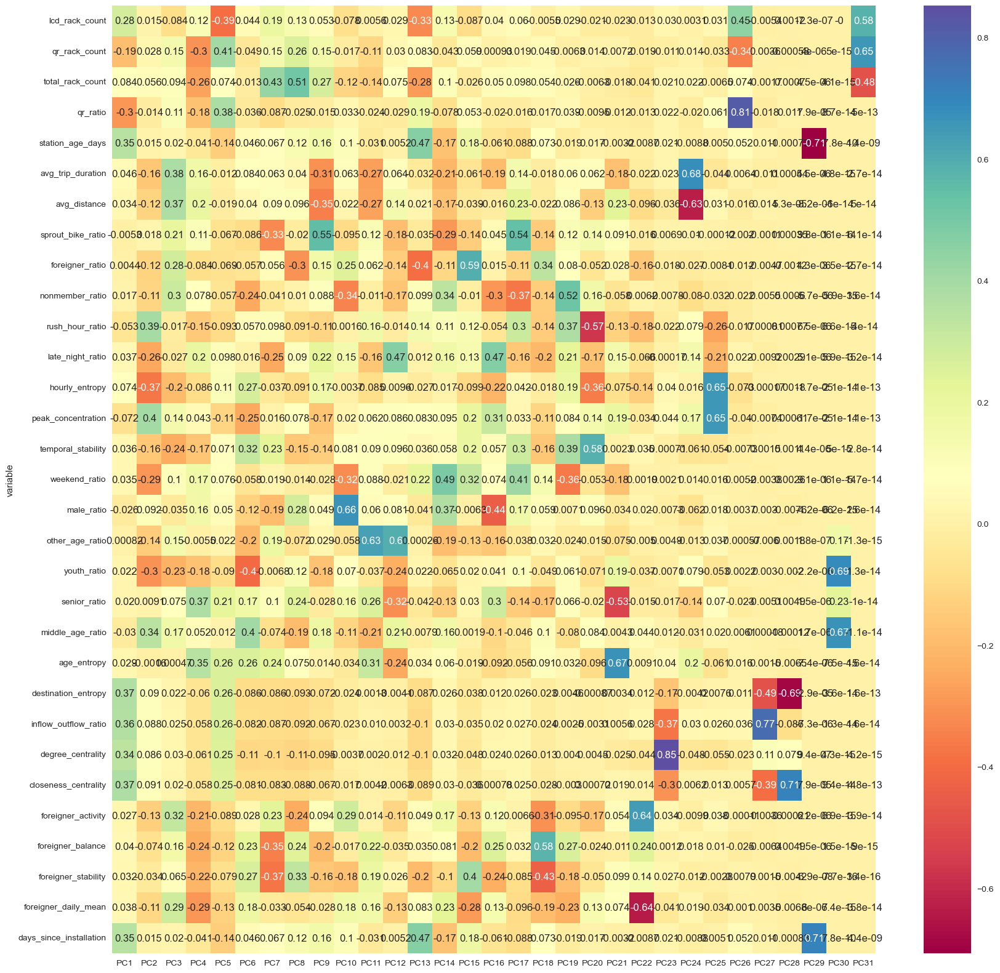

In [88]:
plt.figure(figsize=(20, 20))

ax = sns.heatmap(loadings_df, annot=True, cmap='Spectral')
plt.show()


In [89]:
pca.transform(station_st)

array([[-1.27880054e+00,  2.17100827e+00,  1.66761744e+00, ...,
         4.99650630e-05,  5.32328918e-14, -3.09420134e-13],
       [ 2.39685287e+00,  4.15663079e-01,  3.37129412e+00, ...,
         1.58052316e-04,  1.75765945e-13, -9.86338190e-13],
       [ 1.84925090e+00,  2.38758314e+00,  1.16758213e+00, ...,
        -7.69254348e-04, -8.44888700e-13,  4.78579956e-12],
       ...,
       [-3.74381793e+00, -3.90267999e-01, -1.13596528e+00, ...,
         4.67901714e-04,  5.17869360e-13, -2.91292978e-12],
       [-4.24121099e+00,  2.47188472e+00, -1.51481015e+00, ...,
         4.22129312e-04,  4.61794304e-13, -2.62863384e-12],
       [-4.07210569e+00,  1.66568957e+00,  4.11408252e-01, ...,
         4.38788279e-04,  4.85231983e-13, -2.73417880e-12]])

In [92]:
scores = pca.transform(station_st).transpose()

In [94]:
num_pc = pca.components_.shape[1]
pc_list = ["PC"+ str(i) for i in list(range(1, num_pc+1))]
scores_df = pd.DataFrame.from_dict(dict(zip(pc_list, scores)))
scores_df['station'] = station.index
scores_df = scores_df.set_index('station')
scores_df

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31
station,,,,,,,,,,,,,,,,,,,,,
0,-1.278801,2.171008,1.667617,-1.361866,-0.743401,0.500099,0.332413,1.015629,3.825157,0.608525,...,-0.524710,0.266085,0.268663,0.491140,-0.066388,0.061969,-0.015334,0.000050,5.323289e-14,-3.094201e-13
1,2.396853,0.415663,3.371294,-3.074849,0.476281,0.372619,0.375398,-2.025600,2.098002,2.248862,...,1.498196,0.378492,-0.035983,0.490822,0.222699,0.029743,-0.071755,0.000158,1.757659e-13,-9.863382e-13
2,1.849251,2.387583,1.167582,-0.856940,0.906609,1.126183,-0.952035,-1.041819,1.543019,0.714605,...,-0.349353,0.021574,-0.337037,-0.137331,0.420696,0.034259,-0.078329,-0.000769,-8.448887e-13,4.785800e-12
3,-0.793346,1.639199,1.673828,-0.790485,-0.726754,2.043338,0.239007,1.190246,1.877151,1.206063,...,0.332703,0.231823,-0.070873,-0.011524,0.144473,0.086737,-0.015684,-0.000967,-1.064254e-12,6.018036e-12
4,2.298417,1.592680,1.988352,-0.876814,1.140584,0.529949,-1.960763,-0.317864,1.788462,1.406039,...,-0.088290,0.566183,-0.122284,0.312987,0.292966,0.068944,0.337609,0.000138,1.537194e-13,-8.552247e-13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2761,-4.347718,3.318864,-0.425964,-0.350971,0.133793,-0.766418,0.429156,-0.810860,0.214693,-1.347677,...,0.439716,0.048932,-0.323743,0.458175,-0.256769,-0.009795,0.012022,0.000428,4.723349e-13,-2.661615e-12
2762,-4.051800,1.743331,-0.843100,1.927078,0.661735,-0.117372,0.230457,-1.179440,-0.655067,0.169673,...,0.518001,0.017234,-0.255394,-0.172936,0.054972,-0.007434,-0.004851,0.000450,4.948536e-13,-2.806782e-12
2763,-3.743818,-0.390268,-1.135965,1.186253,1.046225,0.093278,-0.554313,-1.198103,1.740490,-0.811692,...,0.401970,0.095031,-0.216096,0.237873,-0.094862,-0.030899,0.018290,0.000468,5.178694e-13,-2.912930e-12


In [96]:
# check which object (country in this case) has the highest scores
scores_df.sort_values(by=['PC1'],ascending=False).head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31
station,,,,,,,,,,,,,,,,,,,,,
838,4.959623,-2.029466,-2.309446,-2.590143,-0.936656,-3.504449,-0.919726,1.604996,-1.182910,1.018450,...,-0.009310,2.021018,-0.090329,-0.344979,0.510050,0.086847,0.010323,0.000170,1.891557e-13,-1.054588e-12
1181,4.862101,-3.542988,5.988509,-0.637380,-1.620797,-2.152204,1.648244,-2.525337,-1.388034,-0.283352,...,-1.025717,0.806746,-1.207448,-0.100428,0.055073,0.336652,-0.062328,0.000086,9.305587e-14,-5.393419e-13
1097,4.615215,0.688693,0.070499,-0.192816,-0.233281,0.881501,1.206770,-0.052794,-0.063301,-2.381960,...,-0.333243,1.682490,-0.579004,-0.075079,0.570780,0.050225,0.112870,0.000047,6.254626e-14,-2.915991e-13
1911,4.551599,-0.311942,-0.176096,-0.589932,-0.972522,1.620728,-0.197849,2.618677,0.961807,-0.576651,...,0.385463,1.100635,0.306380,0.036675,1.307866,-0.008544,0.226289,0.000204,2.284321e-13,-1.267628e-12
2018,4.424020,-0.585864,-0.789926,-0.392080,0.633293,0.170480,0.362620,0.480680,-0.854350,-0.109529,...,-0.089370,1.852828,-0.327976,-0.073565,0.344967,0.142245,0.201638,-0.000488,-5.307083e-13,3.040976e-12
986,4.404180,-1.033130,1.479292,0.127984,-0.351385,1.882325,1.661532,-0.136346,-0.396852,0.295688,...,-0.742004,0.772859,-0.292724,-0.056862,0.538342,0.007355,-0.086792,0.000066,7.271501e-14,-4.154572e-13
1810,4.349106,-1.023883,4.148044,-1.437264,-1.850344,0.919243,2.509071,-0.766666,-1.307954,0.575777,...,1.344598,0.277746,-0.536951,-0.063338,0.504429,0.104326,-0.019132,0.000086,9.553663e-14,-5.388571e-13
309,4.324245,-0.587476,-0.591947,-0.151184,-0.363129,0.964965,0.387567,0.657805,0.194675,-0.044335,...,-0.596824,0.678421,0.238101,0.133985,0.597643,0.191182,-0.160374,0.000029,3.228703e-14,-1.814495e-13
1787,4.284182,-0.601662,-0.524450,-0.791920,-0.662247,0.876879,0.217116,0.671421,0.253795,-0.882705,...,0.151102,0.471772,0.457040,-0.067152,0.575079,0.087713,-0.022363,0.000060,6.854140e-14,-3.749977e-13


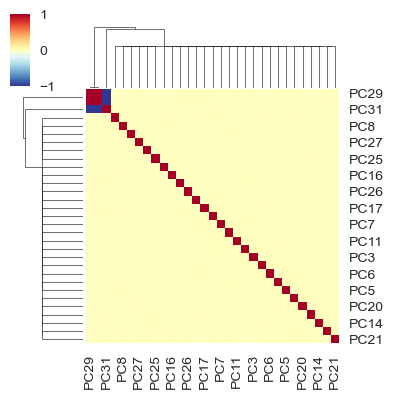

In [98]:
# Confirm that principal components are independent of each other
cor = scores_df.corr()
sns.clustermap(cor, annot = False, cmap = 'RdYlBu_r',vmin = -1, vmax = 1,figsize=(4,4),)

In [100]:
# biplot: https://sukhbinder.wordpress.com/2015/08/05/biplot-with-python/
def biplot(score, coeff, pcax, pcay, labels=None):
  pca1 = pcax - 1
  pca2 = pcay - 1
    
  xs = score[:,pca1]
  ys = score[:,pca2]
    
  scalex = 1.0/(xs.max()- xs.min())
  scaley = 1.0/(ys.max()- ys.min())
    
  plt.figure(figsize=(8, 6))  
  plt.scatter(xs*scalex, ys*scaley, alpha = 0.5)

  n = coeff.shape[0]
  for i in range(n):
    plt.arrow(0, 0, coeff[i,pca1], coeff[i,pca2],color='r',alpha=0.5)
    if labels is None:
      plt.text(coeff[i,pca1]* 1.15, coeff[i,pca2] * 1.15, "Var"+str(i+1), color='g', ha='center', va='center')
    else:
      plt.text(coeff[i,pca1]* 1.15, coeff[i,pca2] * 1.15, labels[i], color='g', ha='center', va='center')
  plt.xlim(-1,1)
  plt.ylim(-1,1)
    
  plt.xlabel(f"PC{pcax} ({pca.explained_variance_ratio_[pca1]*100:.2f} %)")
  plt.ylabel(f"PC{pcay} ({pca.explained_variance_ratio_[pca2]*100:.2f} %)")
  plt.grid()

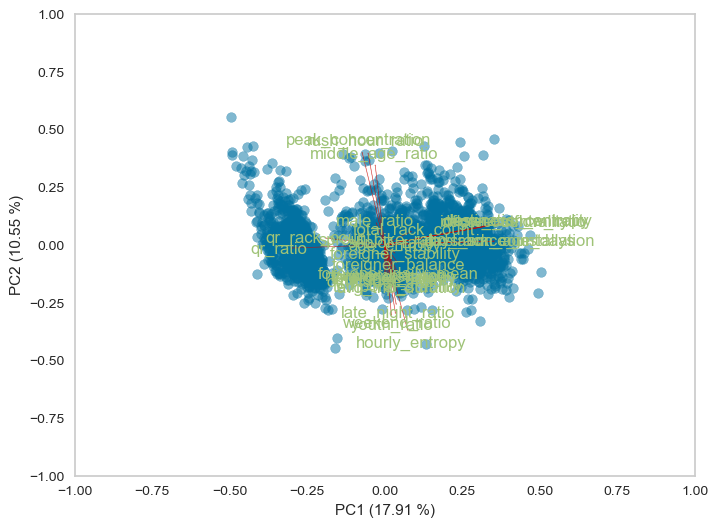

In [102]:
#first biplot
scores = pca.transform(station_st)
biplot(scores, pca.components_.T, 1, 2, labels=station.columns)
#too correlated 
#Do I need tod apply StandardScaler?


In [104]:
#peak_concentration, middle_age_ratio, hourly_entropy, qr_ratio stands out


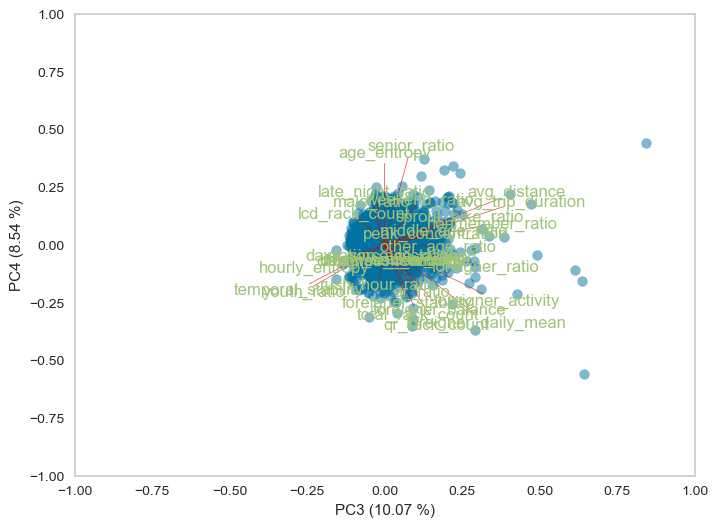

In [106]:
#Second biplot
#same as first
scores = pca.transform(station_st)
biplot(scores, pca.components_.T, 3, 4, labels=station.columns)

In [108]:
#It is confused that most data points are located in center all three biplot 

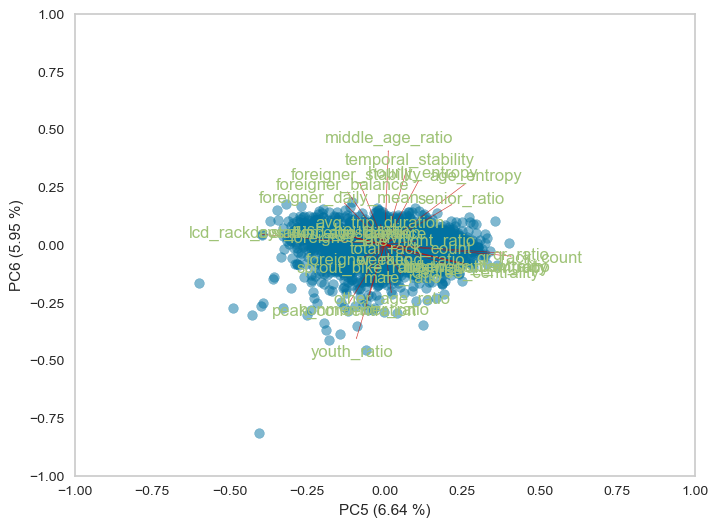

In [110]:
scores = pca.transform(station_st)
biplot(scores, pca.components_.T, 5, 6, labels=station.columns)

In [112]:
#youth ratio, middle_age_ratio, temporal stability, lcd rack stands out


In [114]:
#Dimentionality reduction(Demo 6) finished

In [116]:
from sklearn.datasets import make_blobs
blobs_x, blobs_y = make_blobs(n_samples = 4000, centers = 12, shuffle = True, random_state = 10)

In [118]:
clt = AgglomerativeClustering(linkage = 'ward', 
                              metric = 'euclidean', 
                              distance_threshold = 12, 
                              n_clusters = None)
clt = clt.fit_predict(blobs_x)

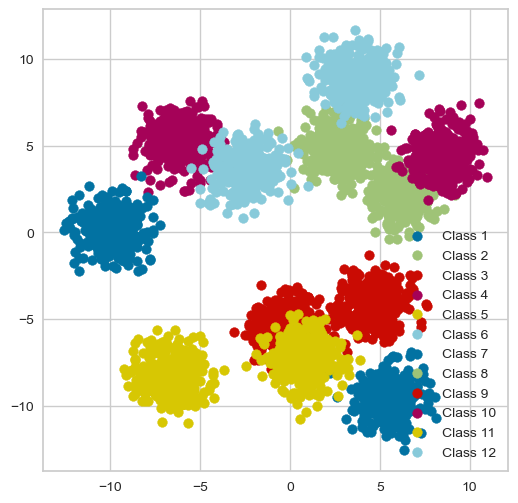

In [120]:
plt.figure(figsize = (6,6))
for c in np.unique(blobs_y):
    plt.scatter(blobs_x[blobs_y == c, 0], blobs_x[blobs_y == c, 1], label = 'Class {}'.format(c+1))
plt.legend()
plt.show()

In [122]:
linkage_matrix = linkage(blobs_x, method='ward', metric='euclidean')

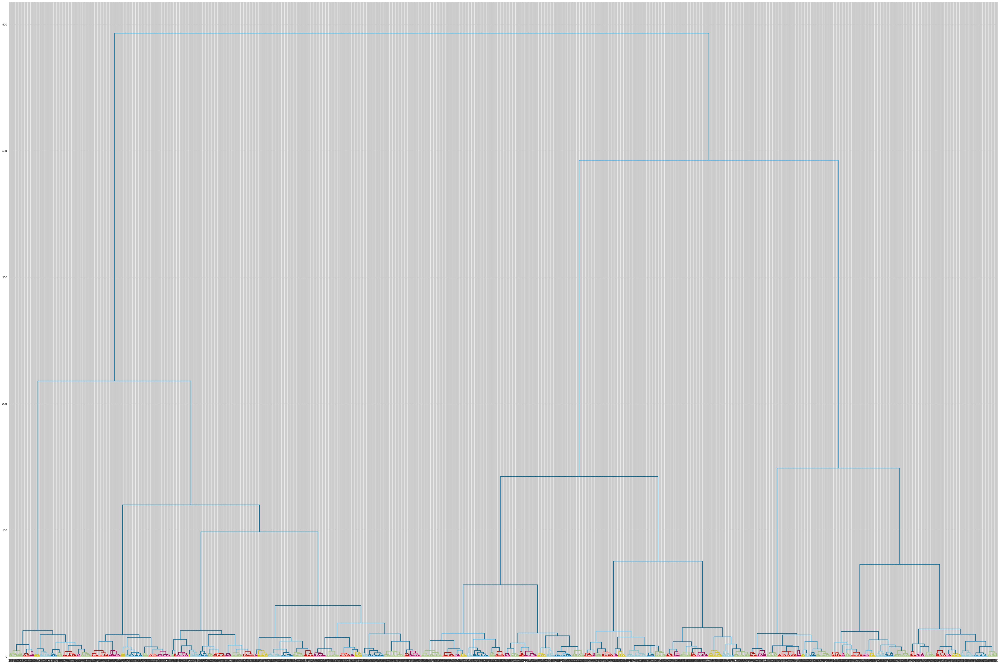

In [124]:
plt.figure(figsize=(60, 40))

dend = dendrogram(linkage_matrix, color_threshold=5)
plt.show()


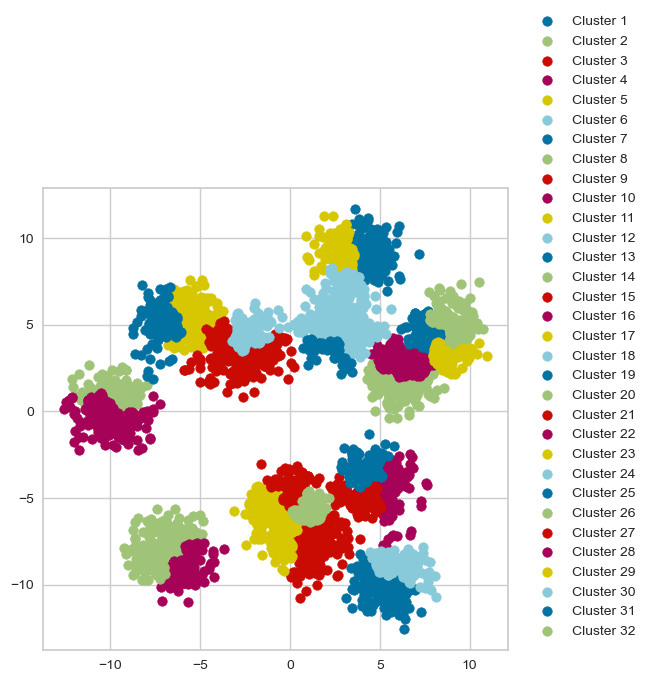

In [125]:
clt = AgglomerativeClustering(linkage = 'ward', 
                              metric = 'euclidean', 
                              distance_threshold = 15, 
                              n_clusters = None)
clt = clt.fit_predict(blobs_x)
plt.figure(figsize=(6,6))
for c in np.unique(clt):
    plt.scatter(blobs_x[clt == c, 0], blobs_x[clt == c, 1], label = 'Cluster {}'.format(c+1))
plt.legend(loc=4, bbox_to_anchor = (1.3, 0))

In [126]:
km = KMeans(
        n_clusters = 12,
        init = 'random',
        random_state = 2025)

km = km.fit_predict(blobs_x)
#I DID 12 first

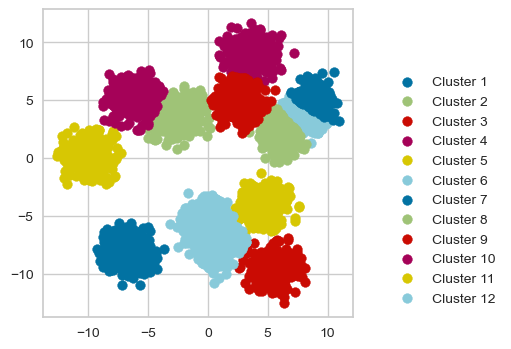

In [127]:
plt.figure(figsize=(4, 4))
for c in np.unique(km):
    plt.scatter(blobs_x[km == c,0], blobs_x[km == c,1], label='Cluster {}'.format(c+1))
plt.legend(loc=4, bbox_to_anchor=(1.5, 0.0))

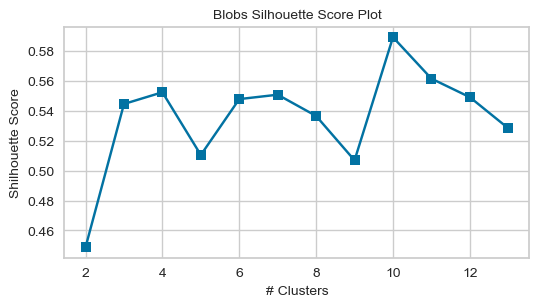

In [128]:
scores = []
cluster_results = {}
for i in np.arange(2, 14):
    km = KMeans(n_clusters= i) 
    cluster_results[i] = km.fit_predict(blobs_x)
    scores.append(silhouette_score(blobs_x, km.labels_))
    
plt.figure(figsize=(6, 3))
plt.title('Blobs Silhouette Score Plot', fontsize=10)
plt.xlabel('# Clusters', fontsize=10)
plt.ylabel('Shilhouette Score', fontsize=10)
plt.plot(np.arange(2, 14), scores, marker='s')
plt.show()

In [ ]:
#THE BEST IS 11

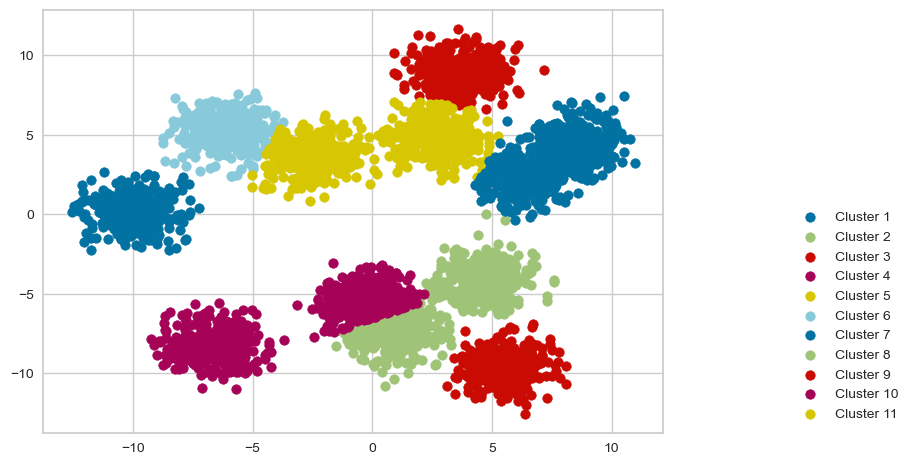

In [134]:
_results = cluster_results[11]
for c in np.unique(_results):
    plt.scatter(blobs_x[_results == c,0], blobs_x[_results == c,1], label='Cluster {}'.format(c+1))
plt.legend(loc=4, bbox_to_anchor=(1.4, 0.0))
plt.show()

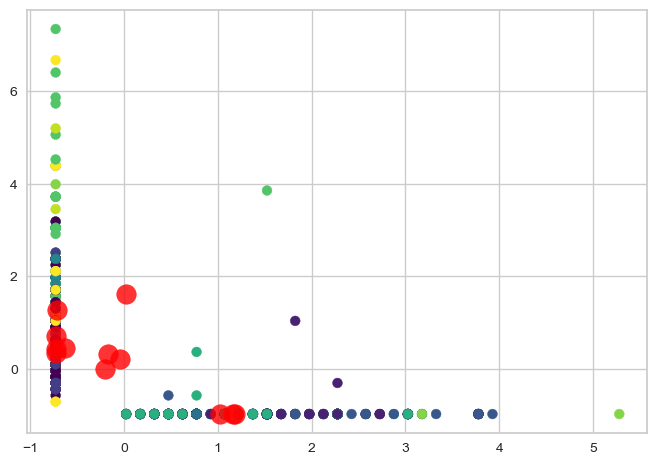

In [136]:
kmeans = KMeans(n_clusters=12)
station_fit = kmeans.fit(station_st)
#Simple  

clusters = station_fit.labels_
centers = station_fit.cluster_centers_

plt.scatter(station_st.iloc[:, 0], station_st.iloc[:, 1], c=clusters, s=50, cmap="viridis")

plt.scatter(centers[:, 0], centers[:, 1], c="red", s=200, alpha=0.8)
plt.show()

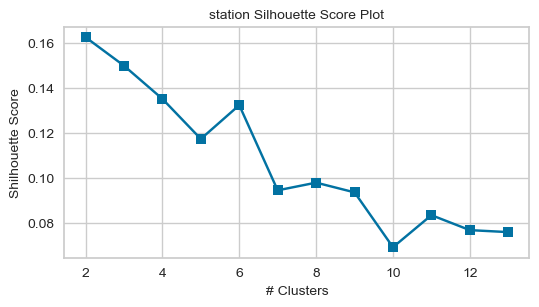

In [137]:
kmeans = KMeans()

scores = []
cluster_results = {}
for _n_clusters in np.arange(2, 14):
    kmeans.n_clusters = _n_clusters
    cluster_results[_n_clusters] = kmeans.fit_predict(station_st)
    scores.append(silhouette_score(station_st, kmeans.labels_))
  #empty list saving is using .append  
plt.figure(figsize=(6, 3))
plt.title('station Silhouette Score Plot', fontsize=10)
plt.xlabel('# Clusters', fontsize=10)
plt.ylabel('Shilhouette Score', fontsize=10)
plt.plot(np.arange(2, 14), scores, marker='s')
plt.show()
#find best score 
#2

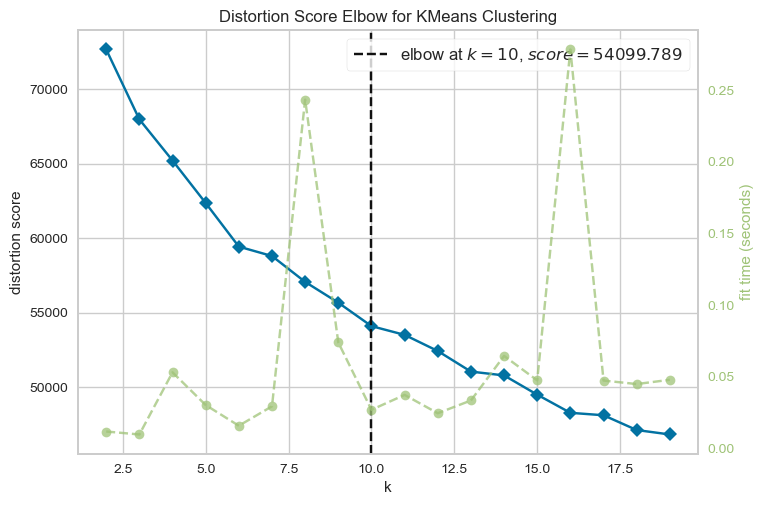

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [139]:
kmeans = KMeans()
elbow = KElbowVisualizer(kmeans, k=(2,20))
elbow.fit(station_st)
elbow.show()

In [ ]:
#10 is best at this point

In [140]:
# Final Model with Optimum k cluster.
kmeans = KMeans(n_clusters=9)
kmeans = kmeans.fit(station_st)

station['cluster'] = kmeans.labels_
station['cluster'] = station['cluster'] + 1
print(station['cluster'].unique())

station.head()

[5 4 8 9 2 1 6 7 3]


,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,nonmember_ratio,...,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean,days_since_installation,cluster
0,0.0,20.0,20.0,1.0,3883,15.625478,1.487048,0.091720,0.002548,0.001274,...,0.000000,0.000000,0.000000,0.000000,61.0,0.196078,0.420806,1.967742,3889,5
1,0.0,12.0,12.0,1.0,3883,16.966642,1.635869,0.058738,0.001450,0.007252,...,4.140862,1.053792,0.099198,0.404017,377.0,0.984211,0.182805,4.010638,3889,4
2,0.0,8.0,8.0,1.0,3884,15.733066,1.441492,0.042649,0.000000,0.008530,...,3.877326,0.992530,0.081692,0.380265,59.0,0.552632,0.358085,2.565217,3889,8
3,0.0,16.0,16.0,1.0,4157,21.576068,2.109980,0.034188,0.000855,0.001709,...,0.000000,0.000000,0.000000,0.000000,66.0,1.062500,0.408887,1.650000,4162,5
4,0.0,11.0,11.0,1.0,3883,20.488591,1.989540,0.064430,0.004027,0.004027,...,3.634888,1.029791,0.113786,0.455242,38.0,1.235294,0.457997,1.809524,3889,8


In [141]:
pd.set_option('display.max_rows', None)
station.sort_values(by=['cluster'],ascending=True)

,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,nonmember_ratio,...,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean,days_since_installation,cluster
1404,17.0,0.0,17.0,0.000000,3318,17.597590,1.789929,0.001928,0.000000,0.003373,...,3.580481,1.169557,0.058352,0.344151,13.0,1.166667,0.211773,1.857143,3324,1
2400,30.0,0.0,30.0,0.000000,3254,16.106175,1.865548,0.011295,0.000000,0.005271,...,4.108047,0.970480,0.067834,0.386114,2.0,0.000000,1.000000,1.000000,3260,1
2399,10.0,0.0,10.0,0.000000,3254,17.503425,1.493584,0.007991,0.001142,0.002283,...,3.292066,0.913208,0.035376,0.358209,25.0,1.083333,0.411495,1.785714,3260,1
644,8.0,0.0,8.0,0.000000,3115,16.265517,1.607834,0.024138,0.003448,0.000000,...,4.093246,0.960245,0.077681,0.453958,6.0,1.000000,0.615100,1.500000,3121,1
2398,11.0,0.0,11.0,0.000000,3254,15.817655,1.606211,0.013531,0.000000,0.006443,...,0.000000,0.000000,0.000000,0.000000,10.0,0.428571,0.449243,1.428571,3260,1
2394,10.0,0.0,10.0,0.000000,3254,14.392197,1.706987,0.016427,0.000000,0.006160,...,0.000000,0.000000,0.000000,0.000000,7.0,6.000000,0.608770,1.400000,3260,1
2391,9.0,0.0,9.0,0.000000,3318,17.596073,1.684260,0.009818,0.000000,0.000000,...,3.106633,0.552381,0.020788,0.317586,10.0,1.000000,0.047810,2.500000,3324,1
2390,10.0,0.0,10.0,0.000000,3259,18.550652,1.553208,0.004514,0.000502,0.005015,...,0.000000,0.000000,0.000000,0.000000,64.0,1.064516,0.286850,2.370370,3265,1
650,8.0,0.0,8.0,0.000000,3115,15.551205,1.655406,0.012048,0.000000,0.006024,...,4.230299,0.990463,0.130926,0.369930,12.0,1.400000,0.715362,1.714286,3121,1
2384,10.0,0.0,10.0,0.000000,3254,13.418927,1.431684,0.005047,0.000000,0.003155,...,4.017785,0.975833,0.111233,0.370531,5.0,0.666667,1.000000,1.000000,3260,1


In [142]:
station.groupby('cluster').groups

{1: [24, 25, 26, 27, 33, 34, 35, 36, 40, 41, 42, 45, 52, 54, 55, 56, 57, 58, 114, 115, 116, 117, 119, 120, 124, 126, 128, 134, 135, 186, 187, 188, 189, 197, 200, 201, 206, 208, 209, 211, 214, 215, 216, 219, 221, 274, 275, 277, 280, 282, 299, 300, 303, 304, 309, 316, 319, 325, 363, 364, 366, 367, 368, 369, 370, 373, 374, 375, 376, 377, 380, 381, 382, 383, 384, 385, 394, 397, 398, 399, 400, 402, 403, 409, 413, 415, 447, 448, 449, 450, 451, 454, 457, 461, 469, 470, 472, 475, 479, 480, ...], 2: [15, 30, 31, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 88, 90, 91, 92, 93, 94, 97, 98, 99, 130, 140, 142, 151, 156, 157, 159, 160, 162, 164, 165, 168, 170, 172, 175, 178, 179, 180, 181, 182, 183, 184, 185, 222, 225, 231, 235, 240, 241, 245, 249, 251, 254, 255, 256, 260, 262, 263, 264, 265, 266, 267, 269, 270, 271, 272, 292, 308, 317, 320, 327, 328, 329, 330, 331, 332, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 346, 348, 350, 352, 353, ...], 3: [62, 89, 95, 252, 347, 

In [143]:
station.groupby('cluster').mean()

,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,nonmember_ratio,...,age_entropy,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean,days_since_installation
cluster,,,,,,,,,,,,,,,,,,,,,
1,12.786232,0.009058,12.795290,0.000362,3182.668478,19.385880,2.053826,0.014382,0.000564,0.004746,...,1.563107,2.802941,0.713626,0.056350,0.293694,22.358696,1.083366,0.541287,1.631969,3188.449275
2,0.110075,10.490672,10.600746,0.986940,1892.149254,18.827752,1.953954,0.015714,0.000778,0.004742,...,1.533965,0.005746,0.000333,0.000037,0.000652,25.320896,1.007503,0.502440,1.726675,1897.218284
3,0.068421,9.747368,9.815789,0.992105,1704.705263,17.091165,1.894186,0.014579,0.000055,0.003591,...,1.623506,0.016269,0.001603,0.000149,0.001775,0.581579,0.022839,0.000327,0.369908,1709.734211
4,3.675325,10.129870,13.805195,0.753247,2844.246753,27.947726,3.273421,0.026520,0.012063,0.015277,...,1.539956,2.165074,0.559434,0.047245,0.221054,249.688312,1.114025,0.270703,2.962049,2849.688312
5,4.153439,7.746032,11.899471,0.677249,2430.825397,17.438655,1.989122,0.019420,0.000406,0.003425,...,1.500595,1.444406,0.377161,0.027945,0.151735,16.470899,0.610001,0.276984,1.271234,2436.142857
6,11.710145,0.038647,11.748792,0.002424,3136.780193,17.800985,1.937981,0.015284,0.000038,0.003751,...,1.637344,2.935991,0.766182,0.056841,0.310328,0.538647,0.039010,0.004157,0.473229,3142.577295
7,3.849315,6.616438,10.465753,0.643836,2510.438356,27.700883,3.306445,0.040832,0.000778,0.032842,...,1.594361,2.004698,0.529327,0.040736,0.206528,19.123288,0.685597,0.271818,1.241966,2515.780822
8,0.000000,11.576190,11.576190,1.000000,2755.040476,18.403993,1.947923,0.014638,0.000494,0.004577,...,1.589905,3.682170,0.961221,0.073010,0.380030,19.359524,0.765936,0.328189,1.299313,2760.361905
9,0.256000,25.032000,25.288000,0.993397,2970.240000,18.199229,1.960818,0.015322,0.000707,0.005807,...,1.555939,3.358117,0.879577,0.065733,0.350691,35.392000,0.984586,0.458690,1.650232,2975.736000


In [144]:
# 9 cluster

In [145]:
X = station.drop(columns=['cluster'])
y = station['cluster']

from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X, y)

RandomForestClassifier()

In [147]:
X

,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,nonmember_ratio,...,age_entropy,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean,days_since_installation
0,0.0,20.0,20.0,1.000000,3883,15.625478,1.487048,0.091720,0.002548,0.001274,...,1.571667,0.000000,0.000000,0.000000,0.000000,61.0,0.196078,0.420806,1.967742,3889
1,0.0,12.0,12.0,1.000000,3883,16.966642,1.635869,0.058738,0.001450,0.007252,...,1.549042,4.140862,1.053792,0.099198,0.404017,377.0,0.984211,0.182805,4.010638,3889
2,0.0,8.0,8.0,1.000000,3884,15.733066,1.441492,0.042649,0.000000,0.008530,...,1.574669,3.877326,0.992530,0.081692,0.380265,59.0,0.552632,0.358085,2.565217,3889
3,0.0,16.0,16.0,1.000000,4157,21.576068,2.109980,0.034188,0.000855,0.001709,...,1.565585,0.000000,0.000000,0.000000,0.000000,66.0,1.062500,0.408887,1.650000,4162
4,0.0,11.0,11.0,1.000000,3883,20.488591,1.989540,0.064430,0.004027,0.004027,...,1.551401,3.634888,1.029791,0.113786,0.455242,38.0,1.235294,0.457997,1.809524,3889
5,0.0,31.0,31.0,1.000000,3883,14.406222,1.366690,0.037778,0.000000,0.002667,...,1.450958,4.416383,0.909732,0.107221,0.395777,26.0,0.529412,0.637835,1.368421,3889
6,0.0,13.0,13.0,1.000000,3884,18.457213,2.064825,0.041565,0.000000,0.002445,...,1.601896,3.897997,1.005677,0.105033,0.406297,18.0,1.000000,0.587989,1.636364,3889
7,0.0,10.0,10.0,1.000000,3883,25.097808,1.918898,0.030354,0.006745,0.015177,...,1.563958,0.000000,0.000000,0.000000,0.000000,154.0,0.811765,0.305815,2.298507,3889
8,0.0,8.0,8.0,1.000000,3884,21.316600,1.730897,0.028112,0.000669,0.008701,...,1.537235,3.567246,0.997812,0.047411,0.338238,61.0,0.794118,0.359631,1.794118,3889
9,0.0,15.0,15.0,1.000000,3883,16.205689,1.626006,0.043764,0.008753,0.003282,...,1.581490,3.553618,1.019820,0.063457,0.399009,162.0,0.951807,0.251850,2.531250,3889


In [148]:
y = station['cluster']

In [149]:
y.head()

0    5
1    4
2    8
3    5
4    8
Name: cluster, dtype: int32

In [150]:

# data mining
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, r2_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from tqdm import tqdm



In [151]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 2020)

# normalize features
normalizer = StandardScaler()
X_train = normalizer.fit_transform(X_train)
X_test = normalizer.fit_transform(X_test)

print(X_train.shape)
print(X_test.shape)

(1936, 31)
(830, 31)


In [164]:
print(y.value_counts())

cluster
1    552
2    536
8    420
6    414
3    380
5    189
9    125
4     77
7     73
Name: count, dtype: int64


In [166]:
# one cluster is taken very little portion. I changed 9 cluster to 8 cluster

In [168]:
rfc = RandomForestClassifier(n_estimators = 10, n_jobs = -1, random_state = 2020) # we merge 10 trees
rfc.fit(X_train, y_train.values.ravel()) 
# .values gives an np array, .ravel flattens the data 
# it works simply with y_train

RandomForestClassifier(n_estimators=10, n_jobs=-1, random_state=2020)

In [170]:
rfc = RandomForestClassifier(n_estimators=100, 
                       criterion='gini', 
                       max_depth=None, 
                       min_samples_split=2, 
                       min_samples_leaf=1, 
                       min_weight_fraction_leaf=0.0, 
                       max_features='sqrt', 
                       max_leaf_nodes=None, 
                       min_impurity_decrease=0.0, 
                       bootstrap=True, 
                       oob_score=False, 
                       n_jobs=None, 
                       random_state=None, 
                       verbose=0, 
                       warm_start=False, 
                       class_weight=None, 
                       ccp_alpha=0.0, 
                       max_samples=None,
                       monotonic_cst=None)
rfc.fit(X_train, y_train.values.ravel()) 

RandomForestClassifier()

In [172]:
# train set
y_train_pred = rfc.predict(X_train)
print('Training Accuracy: {:.3f}'.format(accuracy_score(y_train, y_train_pred)))

# test set
y_test_pred = rfc.predict(X_test)
print('Testing Accuracy: {:.3f}'.format(accuracy_score(y_test, y_test_pred)))

Training Accuracy: 1.000
Testing Accuracy: 0.906


              precision    recall  f1-score   support

           1       0.89      0.98      0.93       152
           2       0.91      0.93      0.92       150
           3       0.90      0.97      0.93       124
           4       0.89      0.68      0.77        25
           5       0.94      0.73      0.82        64
           6       0.94      0.96      0.95       129
           7       1.00      0.17      0.29        24
           8       0.92      0.96      0.94       127
           9       0.76      0.83      0.79        35

    accuracy                           0.91       830
   macro avg       0.91      0.80      0.82       830
weighted avg       0.91      0.91      0.90       830



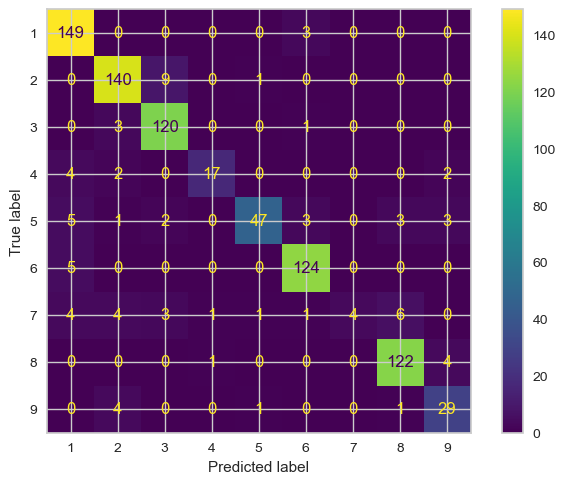

In [174]:
print(classification_report(y_test, y_test_pred))
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred)
plt.show()

100%|███████████████████████████████████████████| 50/50 [00:25<00:00,  1.98it/s]


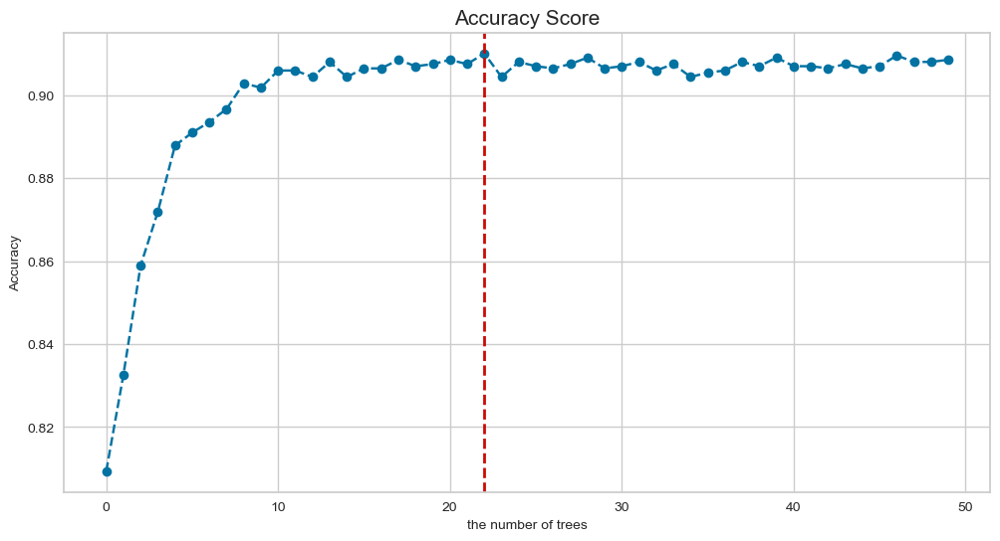

In [176]:
cv_scores = []
estimator_list = [i for i in range(0, 50, 1)]

for i in tqdm(range(0, 50, 1)): # show the progress bar below
    rfc = RandomForestClassifier(n_estimators = i + 1, # vary the number of trees for each iteration
                                 n_jobs = -1, # hardware setting (-1 means the maximum memory usage)
                                 random_state = 2020)
    score = cross_val_score(rfc, X_train, y_train.values.ravel(), cv=10, scoring = 'accuracy').mean()

        # enables repetitive training/testing and get the validation scores
        # cv: the number of validation
        # scoring: validation method
    cv_scores.append(score)
    
    
best_e = [estimator_list[i] for i in range(len(cv_scores)) if cv_scores[i] == np.max(cv_scores)]
    # extract the number of estimator that makes the highest cv_scores (highest accuracy in this case)
    
plt.figure(figsize = (12,6))
plt.legend(["Cross validation scores"], fontsize = 10)
plt.plot(estimator_list, cv_scores, marker = 'o', linestyle = 'dashed')
plt.xlabel("the number of trees", fontsize = 10)
plt.ylabel("Accuracy", fontsize = 10)
plt.title("Accuracy Score", fontsize = 15)
plt.axvline(best_e[0], color = 'r', linestyle = '--', linewidth = 2) # draw a vertial line indicating the best value
plt.show()

In [177]:
#the best is approximately 42 ~43

In [180]:
import shap

In [182]:
# data mining
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, r2_score, classification_report, confusion_matrix, ConfusionMatrixDisplay
from tqdm import tqdm

In [184]:
# np array to pandas dataframe
X_train_df = pd.DataFrame(X_train, columns=X.columns)
X_test_df = pd.DataFrame(X_test, columns=X.columns)

explainer = shap.TreeExplainer(rf) 


shap_values = explainer.shap_values(X_test_df) 

print("SHAP values shape:", np.array(shap_values).shape)
X_test_df.head()

SHAP values shape: (830, 31, 9)


,lcd_rack_count,qr_rack_count,total_rack_count,qr_ratio,station_age_days,avg_trip_duration,avg_distance,sprout_bike_ratio,foreigner_ratio,nonmember_ratio,...,age_entropy,destination_entropy,inflow_outflow_ratio,degree_centrality,closeness_centrality,foreigner_activity,foreigner_balance,foreigner_stability,foreigner_daily_mean,days_since_installation
0,-0.731097,0.384024,-0.362855,0.798023,1.280892,-0.753724,-0.344233,-0.713907,-0.278041,-0.663623,...,-0.356786,0.721680,0.932165,0.343326,0.846841,-0.320989,-0.787997,-0.935729,0.835995,1.281008
1,-0.731097,4.486207,5.381007,0.798023,-0.330916,0.688365,-0.084382,0.936210,1.867077,0.196635,...,-0.277330,-1.061837,-1.035770,-0.881749,-1.070458,7.728247,0.162717,-0.486709,3.394350,-0.331250
2,0.823234,-0.983371,-0.362855,-1.254358,0.227302,-0.336745,-0.470553,-0.745223,-0.278041,-0.201068,...,0.990612,1.099651,1.225759,0.923195,1.128492,-0.320989,-0.787997,2.147077,-0.225636,0.226697
3,-0.731097,-0.026195,-0.937242,0.798023,-0.933496,1.517826,2.176838,-0.147919,-0.278041,-0.322744,...,0.584665,-1.061837,-1.035770,-0.881749,-1.070458,-0.260920,-0.537205,0.998183,-0.013310,-0.933537
4,1.600399,-0.983371,0.594455,-1.254358,1.280892,-0.662736,-0.123798,0.593719,1.097313,-0.203990,...,-2.411718,1.227223,1.104924,1.184545,1.036923,-0.215868,0.779451,0.977101,0.077687,1.281008


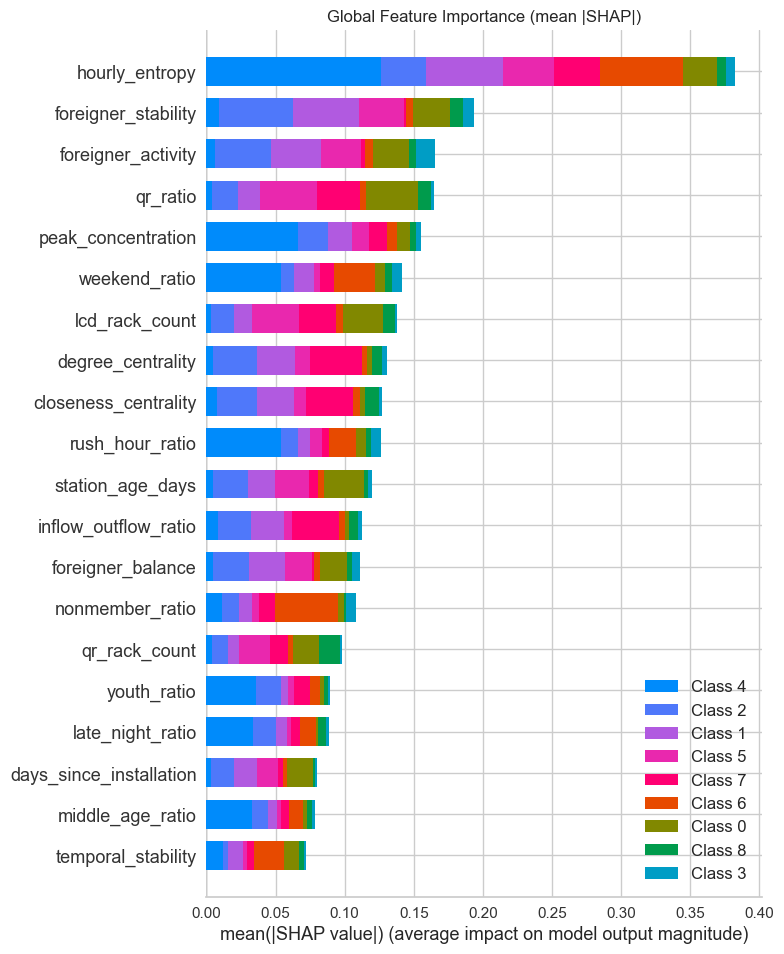

<Figure size 800x550 with 0 Axes>

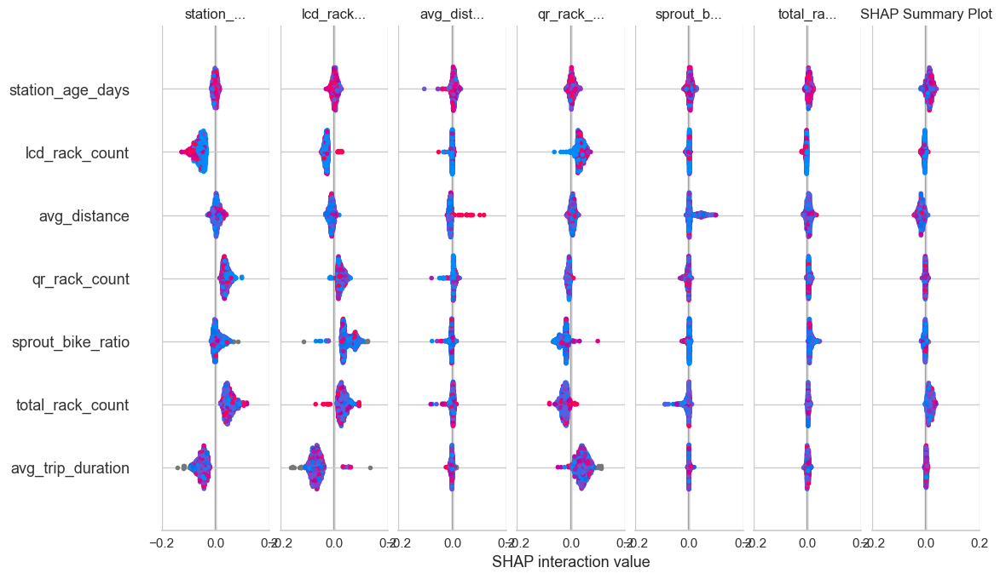

In [186]:
# Global contributions using a bar plot
plt.figure()
shap.summary_plot(shap_values, X_test_df, plot_type="bar", show=False)
plt.title("Global Feature Importance (mean |SHAP|)")
plt.show()

# Global contributions using a beeswarm
plt.figure()
shap.summary_plot(shap_values, X_test_df, show=False)
plt.title("SHAP Summary Plot")
plt.show()

In [ ]:
#Hourly entropy